In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.impute import SimpleImputer
from scipy import stats
import matplotlib as mpl
from google.colab import drive
from scipy.stats import chi2_contingency
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LinearRegression
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import random
from sklearn.preprocessing import StandardScaler
from mpl_toolkits.mplot3d import Axes3D
from sklearn.cluster import DBSCAN
from itertools import combinations

In [5]:
carInsuranceDatasetPath = '/content/car_insurance.csv'
earthquakeDatasetPath = '/content/earthquake_ir.csv'

# Question 1:

### - Preprocessing:

In [15]:
carInsuranceDataset = pd.read_csv(carInsuranceDatasetPath)

In [16]:
carInsuranceDataset.head(5)

,ID,KIDSDRIV,BIRTH,AGE,HOMEKIDS,YOJ,INCOME,PARENT1,HOME_VAL,MSTATUS,...,CAR_TYPE,RED_CAR,OLDCLAIM,CLM_FREQ,REVOKED,MVR_PTS,CLM_AMT,CAR_AGE,CLAIM_FLAG,URBANICITY
0,63581743,0,16MAR39,60.0,0,11.0,"$67,349",No,$0,z_No,...,Minivan,yes,"$4,461",2,No,3,$0,18.0,0,Highly Urban/ Urban
1,132761049,0,21JAN56,43.0,0,11.0,"$91,449",No,"$257,252",z_No,...,Minivan,yes,$0,0,No,0,$0,1.0,0,Highly Urban/ Urban
2,921317019,0,18NOV51,48.0,0,11.0,"$52,881",No,$0,z_No,...,Van,yes,$0,0,No,2,$0,10.0,0,Highly Urban/ Urban
3,727598473,0,05MAR64,35.0,1,10.0,"$16,039",No,"$124,191",Yes,...,z_SUV,no,"$38,690",2,No,3,$0,10.0,0,Highly Urban/ Urban
4,450221861,0,05JUN48,51.0,0,14.0,NaN,No,"$306,251",Yes,...,Minivan,yes,$0,0,No,0,$0,6.0,0,Highly Urban/ Urban


##### checking missing values:

In [17]:
carInsuranceDataframe = pd.DataFrame(carInsuranceDataset)

In [18]:
total1 = carInsuranceDataframe.isnull().sum().sort_values(ascending = False)
percent1 = (carInsuranceDataframe.isnull().sum()/carInsuranceDataframe.isnull().count()).sort_values(ascending = False)
missing_data1 = pd.concat([total1,percent1], axis = 1, keys = ['Total', 'Percent'])
print(missing_data1.to_string())

            Total   Percent
OCCUPATION    665  0.064551
CAR_AGE       639  0.062027
HOME_VAL      575  0.055814
INCOME        570  0.055329
YOJ           548  0.053194
AGE             7  0.000679
ID              0  0.000000
TIF             0  0.000000
CLAIM_FLAG      0  0.000000
CLM_AMT         0  0.000000
MVR_PTS         0  0.000000
REVOKED         0  0.000000
CLM_FREQ        0  0.000000
OLDCLAIM        0  0.000000
RED_CAR         0  0.000000
CAR_TYPE        0  0.000000
TRAVTIME        0  0.000000
BLUEBOOK        0  0.000000
CAR_USE         0  0.000000
KIDSDRIV        0  0.000000
EDUCATION       0  0.000000
GENDER          0  0.000000
MSTATUS         0  0.000000
PARENT1         0  0.000000
HOMEKIDS        0  0.000000
BIRTH           0  0.000000
URBANICITY      0  0.000000


##### checking irrelevant data:

In [19]:
print(carInsuranceDataframe.dtypes)

ID              int64
KIDSDRIV        int64
BIRTH          object
AGE           float64
HOMEKIDS        int64
YOJ           float64
INCOME         object
PARENT1        object
HOME_VAL       object
MSTATUS        object
GENDER         object
EDUCATION      object
OCCUPATION     object
TRAVTIME        int64
CAR_USE        object
BLUEBOOK       object
TIF             int64
CAR_TYPE       object
RED_CAR        object
OLDCLAIM       object
CLM_FREQ        int64
REVOKED        object
MVR_PTS         int64
CLM_AMT        object
CAR_AGE       float64
CLAIM_FLAG      int64
URBANICITY     object
dtype: object


In [20]:
mstatus_categories = carInsuranceDataframe['MSTATUS'].unique().tolist()

print(mstatus_categories)

['z_No', 'Yes']


In [21]:
gender_categories = carInsuranceDataframe['GENDER'].unique().tolist()

print(mstatus_categories)

['z_No', 'Yes']


In [22]:
education_categories = carInsuranceDataframe['EDUCATION'].unique().tolist()

print(education_categories)

['PhD', 'z_High School', 'Bachelors', '<High School', 'Masters']


In [23]:
occupation_categories = carInsuranceDataframe['OCCUPATION'].unique().tolist()

print(occupation_categories)

['Professional', 'z_Blue Collar', 'Manager', 'Clerical', 'Doctor', 'Lawyer', nan, 'Home Maker', 'Student']


In [24]:
carUse_categories = carInsuranceDataframe['CAR_USE'].unique().tolist()

print(carUse_categories)

['Private', 'Commercial']


In [25]:
carType_categories = carInsuranceDataframe['CAR_TYPE'].unique().tolist()

print(carType_categories)

['Minivan', 'Van', 'z_SUV', 'Sports Car', 'Panel Truck', 'Pickup']


In [26]:
urbanicity_categories = carInsuranceDataframe['URBANICITY'].unique().tolist()

print(urbanicity_categories)

['Highly Urban/ Urban', 'z_Highly Rural/ Rural']


##### Finding potential outliers:

In [27]:
carInsuranceDataframe_copy = carInsuranceDataframe.copy()

In [28]:
sign_to_remove = '$'

for col in carInsuranceDataframe_copy.columns:
    if carInsuranceDataframe_copy[col].dtype == 'object':
        carInsuranceDataframe_copy[col] = carInsuranceDataframe_copy[col].str.replace(sign_to_remove, '')

<ipython-input-28-f2e4c741a6a8>:5: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will *not* be treated as literal strings when regex=True.
  carInsuranceDataframe_copy[col] = carInsuranceDataframe_copy[col].str.replace(sign_to_remove, '')


In [29]:
carInsuranceDataframe.head(5)

,ID,KIDSDRIV,BIRTH,AGE,HOMEKIDS,YOJ,INCOME,PARENT1,HOME_VAL,MSTATUS,...,CAR_TYPE,RED_CAR,OLDCLAIM,CLM_FREQ,REVOKED,MVR_PTS,CLM_AMT,CAR_AGE,CLAIM_FLAG,URBANICITY
0,63581743,0,16MAR39,60.0,0,11.0,"$67,349",No,$0,z_No,...,Minivan,yes,"$4,461",2,No,3,$0,18.0,0,Highly Urban/ Urban
1,132761049,0,21JAN56,43.0,0,11.0,"$91,449",No,"$257,252",z_No,...,Minivan,yes,$0,0,No,0,$0,1.0,0,Highly Urban/ Urban
2,921317019,0,18NOV51,48.0,0,11.0,"$52,881",No,$0,z_No,...,Van,yes,$0,0,No,2,$0,10.0,0,Highly Urban/ Urban
3,727598473,0,05MAR64,35.0,1,10.0,"$16,039",No,"$124,191",Yes,...,z_SUV,no,"$38,690",2,No,3,$0,10.0,0,Highly Urban/ Urban
4,450221861,0,05JUN48,51.0,0,14.0,NaN,No,"$306,251",Yes,...,Minivan,yes,$0,0,No,0,$0,6.0,0,Highly Urban/ Urban


In [30]:
carInsuranceDataframe_copy.head(5)

,ID,KIDSDRIV,BIRTH,AGE,HOMEKIDS,YOJ,INCOME,PARENT1,HOME_VAL,MSTATUS,...,CAR_TYPE,RED_CAR,OLDCLAIM,CLM_FREQ,REVOKED,MVR_PTS,CLM_AMT,CAR_AGE,CLAIM_FLAG,URBANICITY
0,63581743,0,16MAR39,60.0,0,11.0,"67,349",No,0,z_No,...,Minivan,yes,"4,461",2,No,3,0,18.0,0,Highly Urban/ Urban
1,132761049,0,21JAN56,43.0,0,11.0,"91,449",No,"257,252",z_No,...,Minivan,yes,0,0,No,0,0,1.0,0,Highly Urban/ Urban
2,921317019,0,18NOV51,48.0,0,11.0,"52,881",No,0,z_No,...,Van,yes,0,0,No,2,0,10.0,0,Highly Urban/ Urban
3,727598473,0,05MAR64,35.0,1,10.0,"16,039",No,"124,191",Yes,...,z_SUV,no,"38,690",2,No,3,0,10.0,0,Highly Urban/ Urban
4,450221861,0,05JUN48,51.0,0,14.0,NaN,No,"306,251",Yes,...,Minivan,yes,0,0,No,0,0,6.0,0,Highly Urban/ Urban


In [31]:
print(carInsuranceDataframe_copy.dtypes)

ID              int64
KIDSDRIV        int64
BIRTH          object
AGE           float64
HOMEKIDS        int64
YOJ           float64
INCOME         object
PARENT1        object
HOME_VAL       object
MSTATUS        object
GENDER         object
EDUCATION      object
OCCUPATION     object
TRAVTIME        int64
CAR_USE        object
BLUEBOOK       object
TIF             int64
CAR_TYPE       object
RED_CAR        object
OLDCLAIM       object
CLM_FREQ        int64
REVOKED        object
MVR_PTS         int64
CLM_AMT        object
CAR_AGE       float64
CLAIM_FLAG      int64
URBANICITY     object
dtype: object


In [32]:
carInsuranceDataframe_copy["INCOME"] = carInsuranceDataframe_copy["INCOME"].str.replace(',', '.').astype(float)

In [33]:
carInsuranceDataframe_copy["HOME_VAL"] = carInsuranceDataframe_copy["HOME_VAL"].str.replace(',', '.').astype(float)

In [34]:
carInsuranceDataframe_copy["BLUEBOOK"] = carInsuranceDataframe_copy["BLUEBOOK"].str.replace(',', '.').astype(float)

In [35]:
carInsuranceDataframe_copy["OLDCLAIM"] = carInsuranceDataframe_copy["OLDCLAIM"].str.replace(',', '.').astype(float)

In [36]:
carInsuranceDataframe_copy["CLM_AMT"] = carInsuranceDataframe_copy["CLM_AMT"].str.replace(',', '.').astype(float)

In [37]:
print(carInsuranceDataframe_copy.dtypes)

ID              int64
KIDSDRIV        int64
BIRTH          object
AGE           float64
HOMEKIDS        int64
YOJ           float64
INCOME        float64
PARENT1        object
HOME_VAL      float64
MSTATUS        object
GENDER         object
EDUCATION      object
OCCUPATION     object
TRAVTIME        int64
CAR_USE        object
BLUEBOOK      float64
TIF             int64
CAR_TYPE       object
RED_CAR        object
OLDCLAIM      float64
CLM_FREQ        int64
REVOKED        object
MVR_PTS         int64
CLM_AMT       float64
CAR_AGE       float64
CLAIM_FLAG      int64
URBANICITY     object
dtype: object


In [38]:
def find_numeric_columns(dataframe):
    numeric_columns = []
    for column in dataframe.columns:
        if dataframe[column].dtype in [int, float]:
            numeric_columns.append(column)
    return numeric_columns
    
def find_outliers_zscore(dataframe, threshold=3):
    outliers = {}
    numeric_columns = find_numeric_columns(dataframe)
    for column in numeric_columns:
        z_scores = stats.zscore(dataframe[column])
        abs_z_scores = np.abs(z_scores)
        outlier_indices = np.where(abs_z_scores > threshold)[0]
        outliers[column] = list(dataframe[column].iloc[outlier_indices])
    return outliers

outliers = find_outliers_zscore(carInsuranceDataframe_copy)

for column in outliers:
    print(f'Potential outliers in {column}:')
    column_outliers = carInsuranceDataframe_copy[carInsuranceDataframe_copy[column].isin(outliers[column])]
    column_outliers_sorted = column_outliers.sort_values(by=column)
    print(column_outliers_sorted[column])

Potential outliers in ID:
Series([], Name: ID, dtype: int64)
Potential outliers in KIDSDRIV:
28      2
6873    2
6775    2
6738    2
6673    2
       ..
8785    3
4547    4
4746    4
2241    4
3410    4
Name: KIDSDRIV, Length: 429, dtype: int64
Potential outliers in AGE:
Series([], Name: AGE, dtype: float64)
Potential outliers in HOMEKIDS:
1053     5
8720     5
8425     5
6476     5
6095     5
6000     5
5572     5
5389     5
4680     5
4547     5
2862     5
2504     5
2435     5
2241     5
1284     5
1249     5
9636     5
10102    5
Name: HOMEKIDS, dtype: int64
Potential outliers in YOJ:
Series([], Name: YOJ, dtype: float64)
Potential outliers in INCOME:
Series([], Name: INCOME, dtype: float64)
Potential outliers in HOME_VAL:
Series([], Name: HOME_VAL, dtype: float64)
Potential outliers in TRAVTIME:
9528      82
7113      82
5181      82
3345      82
272       83
7298      83
6157      83
9675      84
6004      84
3492      84
2723      84
10208     84
1639      84
1434      84
314   

In [39]:
def find_numeric_columns(dataframe):
    numeric_columns = []
    for column in dataframe.columns:
        if dataframe[column].dtype in [int, float]:
            numeric_columns.append(column)
    return numeric_columns

def find_outliers_iqr(dataframe, threshold=1.5):
    outliers = {}
    numeric_columns = find_numeric_columns(dataframe)
    for column in numeric_columns:
        q1 = dataframe[column].quantile(0.25)
        q3 = dataframe[column].quantile(0.75)
        iqr = q3 - q1
        lower_bound = q1 - (threshold * iqr)
        upper_bound = q3 + (threshold * iqr)
        outlier_indices = np.where((dataframe[column] < lower_bound) | (dataframe[column] > upper_bound))[0]
        outliers[column] = list(dataframe[column].iloc[outlier_indices])
    return outliers

outliers = find_outliers_iqr(carInsuranceDataframe_copy)

for column in outliers:
    print(f'Potential outliers in {column}:')
    column_outliers = carInsuranceDataframe_copy[carInsuranceDataframe_copy[column].isin(outliers[column])]
    column_outliers_sorted = column_outliers.sort_values(by=column)
    print(column_outliers_sorted[column])

Potential outliers in ID:
Series([], Name: ID, dtype: int64)
Potential outliers in KIDSDRIV:
8       1
5848    1
5851    1
5882    1
5901    1
       ..
9622    3
2241    4
4746    4
3410    4
4547    4
Name: KIDSDRIV, Length: 1233, dtype: int64
Potential outliers in AGE:
10196    16.0
9830     16.0
3669     16.0
2986     16.0
2861     16.0
2994     17.0
1727     17.0
6852     18.0
5891     18.0
7419     18.0
7742     19.0
8278     19.0
7377     19.0
9107     19.0
454      19.0
6328     19.0
5994     19.0
2023     19.0
5899     20.0
7932     20.0
5224     20.0
427      20.0
4746     70.0
9486     70.0
9126     70.0
8932     70.0
1520     70.0
1049     70.0
4520     71.0
468      72.0
644      72.0
1766     72.0
9967     72.0
8393     73.0
7085     73.0
3400     73.0
4040     73.0
9666     76.0
188      80.0
3031     81.0
Name: AGE, dtype: float64
Potential outliers in HOMEKIDS:
19      3
6670    3
6682    3
6688    3
6694    3
       ..
8720    5
6476    5
2504    5
2435    5
6095    5

##### Handling missing values:

In [40]:
carInsuranceDataframe_noNull = carInsuranceDataframe_copy.copy()

In [41]:
total2 = carInsuranceDataframe_noNull.isnull().sum().sort_values(ascending = False)
percent2 = (carInsuranceDataframe_noNull.isnull().sum()/carInsuranceDataframe_noNull.isnull().count()).sort_values(ascending = False)
missing_data2 = pd.concat([total2, percent2], axis = 1, keys = ['Total', 'Percent'])
print(missing_data2.to_string())

            Total   Percent
OCCUPATION    665  0.064551
CAR_AGE       639  0.062027
HOME_VAL      575  0.055814
INCOME        570  0.055329
YOJ           548  0.053194
AGE             7  0.000679
ID              0  0.000000
TIF             0  0.000000
CLAIM_FLAG      0  0.000000
CLM_AMT         0  0.000000
MVR_PTS         0  0.000000
REVOKED         0  0.000000
CLM_FREQ        0  0.000000
OLDCLAIM        0  0.000000
RED_CAR         0  0.000000
CAR_TYPE        0  0.000000
TRAVTIME        0  0.000000
BLUEBOOK        0  0.000000
CAR_USE         0  0.000000
KIDSDRIV        0  0.000000
EDUCATION       0  0.000000
GENDER          0  0.000000
MSTATUS         0  0.000000
PARENT1         0  0.000000
HOMEKIDS        0  0.000000
BIRTH           0  0.000000
URBANICITY      0  0.000000


##### --- Using BIRTH to fill nan fields in AGE:

In [42]:
carInsuranceDataframe_noNull['BIRTH'] = pd.to_datetime(carInsuranceDataframe_noNull['BIRTH'], format='%d%b%y')

end_of_1999 = pd.to_datetime('12/31/1999')

missing_age_mask = carInsuranceDataframe_noNull['AGE'].isnull()
carInsuranceDataframe_noNull.loc[missing_age_mask, 'AGE'] = (end_of_1999 - carInsuranceDataframe_noNull.loc[missing_age_mask, 'BIRTH']) // pd.Timedelta(days=365.25)

In [43]:
carInsuranceDataframe_noNull

,ID,KIDSDRIV,BIRTH,AGE,HOMEKIDS,YOJ,INCOME,PARENT1,HOME_VAL,MSTATUS,...,CAR_TYPE,RED_CAR,OLDCLAIM,CLM_FREQ,REVOKED,MVR_PTS,CLM_AMT,CAR_AGE,CLAIM_FLAG,URBANICITY
0,63581743,0,2039-03-16,60.0,0,11.0,67.349,No,0.000,z_No,...,Minivan,yes,4.461,2,No,3,0.0,18.0,0,Highly Urban/ Urban
1,132761049,0,2056-01-21,43.0,0,11.0,91.449,No,257.252,z_No,...,Minivan,yes,0.000,0,No,0,0.0,1.0,0,Highly Urban/ Urban
2,921317019,0,2051-11-18,48.0,0,11.0,52.881,No,0.000,z_No,...,Van,yes,0.000,0,No,2,0.0,10.0,0,Highly Urban/ Urban
3,727598473,0,2064-03-05,35.0,1,10.0,16.039,No,124.191,Yes,...,z_SUV,no,38.690,2,No,3,0.0,10.0,0,Highly Urban/ Urban
4,450221861,0,2048-06-05,51.0,0,14.0,NaN,No,306.251,Yes,...,Minivan,yes,0.000,0,No,0,0.0,6.0,0,Highly Urban/ Urban
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10297,67790126,1,2054-08-13,45.0,2,9.0,164.669,No,386.273,Yes,...,Minivan,no,0.000,0,No,2,0.0,17.0,0,Highly Urban/ Urban
10298,61970712,0,2053-06-17,46.0,0,9.0,107.204,No,332.591,Yes,...,Panel Truck,no,0.000,0,No,0,0.0,1.0,0,Highly Urban/ Urban
10299,849208064,0,2051-06-18,48.0,0,15.0,39.837,No,170.611,Yes,...,z_SUV,no,0.000,0,No,0,0.0,1.0,0,Highly Urban/ Urban
10300,627828331,0,2048-12-12,50.0,0,7.0,43.445,No,149.248,Yes,...,Minivan,no,0.000,0,No,0,0.0,11.0,0,Highly Urban/ Urban


In [44]:
total2 = carInsuranceDataframe_noNull.isnull().sum().sort_values(ascending = False)
percent2 = (carInsuranceDataframe_noNull.isnull().sum()/carInsuranceDataframe_noNull.isnull().count()).sort_values(ascending = False)
missing_data2 = pd.concat([total2, percent2], axis = 1, keys = ['Total', 'Percent'])
print(missing_data2.to_string())

            Total   Percent
OCCUPATION    665  0.064551
CAR_AGE       639  0.062027
HOME_VAL      575  0.055814
INCOME        570  0.055329
YOJ           548  0.053194
ID              0  0.000000
TIF             0  0.000000
CLAIM_FLAG      0  0.000000
CLM_AMT         0  0.000000
MVR_PTS         0  0.000000
REVOKED         0  0.000000
CLM_FREQ        0  0.000000
OLDCLAIM        0  0.000000
RED_CAR         0  0.000000
CAR_TYPE        0  0.000000
TRAVTIME        0  0.000000
BLUEBOOK        0  0.000000
CAR_USE         0  0.000000
KIDSDRIV        0  0.000000
EDUCATION       0  0.000000
GENDER          0  0.000000
MSTATUS         0  0.000000
PARENT1         0  0.000000
HOMEKIDS        0  0.000000
AGE             0  0.000000
BIRTH           0  0.000000
URBANICITY      0  0.000000


In [45]:
num_missing_rows = carInsuranceDataframe_noNull.isnull().any(axis=1).sum()

print(num_missing_rows)

2641


##### --- Using EDUCATION to fill nan fields in OCCUPATION:

In [46]:
cont_table = pd.crosstab(carInsuranceDataframe_noNull['EDUCATION'], carInsuranceDataframe_noNull['OCCUPATION'])

chi2, p_value, dof, exp_freq = chi2_contingency(cont_table)

print("Chi-Squared value:", chi2)
print("p-value:", p_value)

Chi-Squared value: 12107.773445857441
p-value: 0.0


In [89]:
le = LabelEncoder()

carInsuranceDataframe_noNull['education_enc'] = le.fit_transform(carInsuranceDataframe_noNull['EDUCATION'])
carInsuranceDataframe_noNull['occupation_enc'] = le.fit_transform(carInsuranceDataframe_noNull['OCCUPATION'])

train_df = carInsuranceDataframe_noNull[carInsuranceDataframe_noNull['OCCUPATION'].notnull()]
test_df = carInsuranceDataframe_noNull[carInsuranceDataframe_noNull['OCCUPATION'].isnull()]

lr = LogisticRegression()
lr.fit(train_df[['education_enc']], train_df['occupation_enc'])

test_df['occupation_enc'] = lr.predict(test_df[['education_enc']])

test_df['OCCUPATION'] = le.inverse_transform(test_df['occupation_enc'])

carInsuranceDataframe_filled = pd.concat([train_df, test_df], axis=0).sort_index()

carInsuranceDataframe_filled.drop(['education_enc', 'occupation_enc'], axis=1, inplace=True)

<ipython-input-89-de61d6e1f1e0>:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_df['occupation_enc'] = lr.predict(test_df[['education_enc']])
<ipython-input-89-de61d6e1f1e0>:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_df['OCCUPATION'] = le.inverse_transform(test_df['occupation_enc'])


In [90]:
carInsuranceDataframe_filled

,ID,KIDSDRIV,BIRTH,AGE,HOMEKIDS,YOJ,INCOME,PARENT1,HOME_VAL,MSTATUS,...,CAR_TYPE,RED_CAR,OLDCLAIM,CLM_FREQ,REVOKED,MVR_PTS,CLM_AMT,CAR_AGE,CLAIM_FLAG,URBANICITY
0,63581743,0,2039-03-16,60.0,0,11.0,67.349,No,0.000,z_No,...,Minivan,yes,4.461,2,No,3,0.0,18.0,0,Highly Urban/ Urban
1,132761049,0,2056-01-21,43.0,0,11.0,91.449,No,257.252,z_No,...,Minivan,yes,0.000,0,No,0,0.0,1.0,0,Highly Urban/ Urban
2,921317019,0,2051-11-18,48.0,0,11.0,52.881,No,0.000,z_No,...,Van,yes,0.000,0,No,2,0.0,10.0,0,Highly Urban/ Urban
3,727598473,0,2064-03-05,35.0,1,10.0,16.039,No,124.191,Yes,...,z_SUV,no,38.690,2,No,3,0.0,10.0,0,Highly Urban/ Urban
4,450221861,0,2048-06-05,51.0,0,14.0,NaN,No,306.251,Yes,...,Minivan,yes,0.000,0,No,0,0.0,6.0,0,Highly Urban/ Urban
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10297,67790126,1,2054-08-13,45.0,2,9.0,164.669,No,386.273,Yes,...,Minivan,no,0.000,0,No,2,0.0,17.0,0,Highly Urban/ Urban
10298,61970712,0,2053-06-17,46.0,0,9.0,107.204,No,332.591,Yes,...,Panel Truck,no,0.000,0,No,0,0.0,1.0,0,Highly Urban/ Urban
10299,849208064,0,2051-06-18,48.0,0,15.0,39.837,No,170.611,Yes,...,z_SUV,no,0.000,0,No,0,0.0,1.0,0,Highly Urban/ Urban
10300,627828331,0,2048-12-12,50.0,0,7.0,43.445,No,149.248,Yes,...,Minivan,no,0.000,0,No,0,0.0,11.0,0,Highly Urban/ Urban


In [91]:
total2 = carInsuranceDataframe_filled.isnull().sum().sort_values(ascending = False)
percent2 = (carInsuranceDataframe_filled.isnull().sum()/carInsuranceDataframe_filled.isnull().count()).sort_values(ascending = False)
missing_data2 = pd.concat([total2, percent2], axis = 1, keys = ['Total', 'Percent'])
print(missing_data2.to_string())

            Total   Percent
CAR_AGE       639  0.062027
HOME_VAL      575  0.055814
INCOME        570  0.055329
YOJ           548  0.053194
ID              0  0.000000
BLUEBOOK        0  0.000000
CLAIM_FLAG      0  0.000000
CLM_AMT         0  0.000000
MVR_PTS         0  0.000000
REVOKED         0  0.000000
CLM_FREQ        0  0.000000
OLDCLAIM        0  0.000000
RED_CAR         0  0.000000
CAR_TYPE        0  0.000000
TIF             0  0.000000
TRAVTIME        0  0.000000
CAR_USE         0  0.000000
KIDSDRIV        0  0.000000
OCCUPATION      0  0.000000
EDUCATION       0  0.000000
GENDER          0  0.000000
MSTATUS         0  0.000000
PARENT1         0  0.000000
HOMEKIDS        0  0.000000
AGE             0  0.000000
BIRTH           0  0.000000
URBANICITY      0  0.000000


##### --- Filling null fields of the remaining columns using their mean:

In [92]:
occupation_income = pd.crosstab(carInsuranceDataframe_filled['OCCUPATION'], carInsuranceDataframe_filled['INCOME'], margins=True)
chi2, p_value, dof, expected = chi2_contingency(occupation_income.values)

print(f"Chi-squared: {chi2}")
print(f"P-value: {p_value}")

Chi-squared: 61632.6568019731
P-value: 1.0


In [93]:
corr_coeff = carInsuranceDataframe_filled['AGE'].corr(carInsuranceDataframe_filled['YOJ'])
corr_coeff

0.14400132205775187

In [94]:
corr_coeff = carInsuranceDataframe_filled['INCOME'].corr(carInsuranceDataframe_filled['YOJ'])
corr_coeff

0.2484784883450374

In [95]:
carInsuranceDataframe_filled['INCOME'] = carInsuranceDataframe_filled['INCOME'].fillna(np.mean(carInsuranceDataframe_filled['INCOME']), inplace=False)

In [96]:
carInsuranceDataframe_filled['CAR_AGE'] = carInsuranceDataframe_filled['CAR_AGE'].fillna(np.mean(carInsuranceDataframe_filled['CAR_AGE']), inplace=False)

In [97]:
carInsuranceDataframe_filled['HOME_VAL'] = carInsuranceDataframe_filled['HOME_VAL'].fillna(np.mean(carInsuranceDataframe_filled['HOME_VAL']), inplace=False)

In [98]:
carInsuranceDataframe_filled['YOJ'] = carInsuranceDataframe_filled['YOJ'].fillna(np.mean(carInsuranceDataframe_filled['YOJ']), inplace=False)

In [99]:
total2 = carInsuranceDataframe_filled.isnull().sum().sort_values(ascending = False)
percent2 = (carInsuranceDataframe_filled.isnull().sum()/carInsuranceDataframe_filled.isnull().count()).sort_values(ascending = False)
missing_data2 = pd.concat([total2, percent2], axis = 1, keys = ['Total', 'Percent'])
print(missing_data2.to_string())

            Total  Percent
ID              0      0.0
CAR_USE         0      0.0
CLAIM_FLAG      0      0.0
CAR_AGE         0      0.0
CLM_AMT         0      0.0
MVR_PTS         0      0.0
REVOKED         0      0.0
CLM_FREQ        0      0.0
OLDCLAIM        0      0.0
RED_CAR         0      0.0
CAR_TYPE        0      0.0
TIF             0      0.0
BLUEBOOK        0      0.0
TRAVTIME        0      0.0
KIDSDRIV        0      0.0
OCCUPATION      0      0.0
EDUCATION       0      0.0
GENDER          0      0.0
MSTATUS         0      0.0
HOME_VAL        0      0.0
PARENT1         0      0.0
INCOME          0      0.0
YOJ             0      0.0
HOMEKIDS        0      0.0
AGE             0      0.0
BIRTH           0      0.0
URBANICITY      0      0.0


In [100]:
carInsuranceDataframe_filled

,ID,KIDSDRIV,BIRTH,AGE,HOMEKIDS,YOJ,INCOME,PARENT1,HOME_VAL,MSTATUS,...,CAR_TYPE,RED_CAR,OLDCLAIM,CLM_FREQ,REVOKED,MVR_PTS,CLM_AMT,CAR_AGE,CLAIM_FLAG,URBANICITY
0,63581743,0,2039-03-16,60.0,0,11.0,67.34900,No,0.000,z_No,...,Minivan,yes,4.461,2,No,3,0.0,18.0,0,Highly Urban/ Urban
1,132761049,0,2056-01-21,43.0,0,11.0,91.44900,No,257.252,z_No,...,Minivan,yes,0.000,0,No,0,0.0,1.0,0,Highly Urban/ Urban
2,921317019,0,2051-11-18,48.0,0,11.0,52.88100,No,0.000,z_No,...,Van,yes,0.000,0,No,2,0.0,10.0,0,Highly Urban/ Urban
3,727598473,0,2064-03-05,35.0,1,10.0,16.03900,No,124.191,Yes,...,z_SUV,no,38.690,2,No,3,0.0,10.0,0,Highly Urban/ Urban
4,450221861,0,2048-06-05,51.0,0,14.0,63.89948,No,306.251,Yes,...,Minivan,yes,0.000,0,No,0,0.0,6.0,0,Highly Urban/ Urban
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10297,67790126,1,2054-08-13,45.0,2,9.0,164.66900,No,386.273,Yes,...,Minivan,no,0.000,0,No,2,0.0,17.0,0,Highly Urban/ Urban
10298,61970712,0,2053-06-17,46.0,0,9.0,107.20400,No,332.591,Yes,...,Panel Truck,no,0.000,0,No,0,0.0,1.0,0,Highly Urban/ Urban
10299,849208064,0,2051-06-18,48.0,0,15.0,39.83700,No,170.611,Yes,...,z_SUV,no,0.000,0,No,0,0.0,1.0,0,Highly Urban/ Urban
10300,627828331,0,2048-12-12,50.0,0,7.0,43.44500,No,149.248,Yes,...,Minivan,no,0.000,0,No,0,0.0,11.0,0,Highly Urban/ Urban


## - Calculating the changes in kmeans clustering accuracy, relative to the number of clusters using the Silhouette criterion:

(The Silhouette score is a useful metric for evaluating the quality of clustering results. It measures how similar each data point is to its own cluster compared to other clusters. The score ranges from -1 to 1, with higher values indicating better clustering results.)

(K-means clustering works on numeric variables, and it's not suitable for categorical or text data.)

In [101]:
carInsuranceDataframe_preprocessed = carInsuranceDataframe_filled.copy()

In [102]:
carInsuranceDataframe_preprocessed.dtypes

ID                     int64
KIDSDRIV               int64
BIRTH         datetime64[ns]
AGE                  float64
HOMEKIDS               int64
YOJ                  float64
INCOME               float64
PARENT1               object
HOME_VAL             float64
MSTATUS               object
GENDER                object
EDUCATION             object
OCCUPATION            object
TRAVTIME               int64
CAR_USE               object
BLUEBOOK             float64
TIF                    int64
CAR_TYPE              object
RED_CAR               object
OLDCLAIM             float64
CLM_FREQ               int64
REVOKED               object
MVR_PTS                int64
CLM_AMT              float64
CAR_AGE              float64
CLAIM_FLAG             int64
URBANICITY            object
dtype: object

##### --- As ID is not usefull for clustering, it will be removed:

In [103]:
carInsuranceDataframe_preprocessed.drop(['ID'], axis=1, inplace=True)

##### --- As there exists age column in the dataset, there is no need for birth column. And as it is not convertible to float, i will be removed:


In [104]:
carInsuranceDataframe_preprocessed.drop(['BIRTH'], axis=1, inplace=True)

##### --- Enumerating the object columns 

In [105]:
le = LabelEncoder()
carInsuranceDataframe_preprocessed['PARENT1'] = le.fit_transform(carInsuranceDataframe_preprocessed['PARENT1'])

In [106]:
le = LabelEncoder()
carInsuranceDataframe_preprocessed['MSTATUS'] = le.fit_transform(carInsuranceDataframe_preprocessed['MSTATUS'])

In [107]:
le = LabelEncoder()
carInsuranceDataframe_preprocessed['GENDER'] = le.fit_transform(carInsuranceDataframe_preprocessed['GENDER'])

In [108]:
le = LabelEncoder()
carInsuranceDataframe_preprocessed['EDUCATION'] = le.fit_transform(carInsuranceDataframe_preprocessed['EDUCATION'])

In [109]:
le = LabelEncoder()
carInsuranceDataframe_preprocessed['OCCUPATION'] = le.fit_transform(carInsuranceDataframe_preprocessed['OCCUPATION'])

In [110]:
le = LabelEncoder()
carInsuranceDataframe_preprocessed['CAR_USE'] = le.fit_transform(carInsuranceDataframe_preprocessed['CAR_USE'])

In [111]:
le = LabelEncoder()
carInsuranceDataframe_preprocessed['CAR_TYPE'] = le.fit_transform(carInsuranceDataframe_preprocessed['CAR_TYPE'])

In [112]:
le = LabelEncoder()
carInsuranceDataframe_preprocessed['RED_CAR'] = le.fit_transform(carInsuranceDataframe_preprocessed['RED_CAR'])

In [113]:
le = LabelEncoder()
carInsuranceDataframe_preprocessed['REVOKED'] = le.fit_transform(carInsuranceDataframe_preprocessed['REVOKED'])

In [114]:
le = LabelEncoder()
carInsuranceDataframe_preprocessed['URBANICITY'] = le.fit_transform(carInsuranceDataframe_preprocessed['URBANICITY'])

In [115]:
carInsuranceDataframe_preprocessed.dtypes

KIDSDRIV        int64
AGE           float64
HOMEKIDS        int64
YOJ           float64
INCOME        float64
PARENT1         int64
HOME_VAL      float64
MSTATUS         int64
GENDER          int64
EDUCATION       int64
OCCUPATION      int64
TRAVTIME        int64
CAR_USE         int64
BLUEBOOK      float64
TIF             int64
CAR_TYPE        int64
RED_CAR         int64
OLDCLAIM      float64
CLM_FREQ        int64
REVOKED         int64
MVR_PTS         int64
CLM_AMT       float64
CAR_AGE       float64
CLAIM_FLAG      int64
URBANICITY      int64
dtype: object

In [116]:
carInsuranceDataframe_preprocessed

,KIDSDRIV,AGE,HOMEKIDS,YOJ,INCOME,PARENT1,HOME_VAL,MSTATUS,GENDER,EDUCATION,...,CAR_TYPE,RED_CAR,OLDCLAIM,CLM_FREQ,REVOKED,MVR_PTS,CLM_AMT,CAR_AGE,CLAIM_FLAG,URBANICITY
0,0,60.0,0,11.0,67.34900,0,0.000,1,0,3,...,0,1,4.461,2,0,3,0.0,18.0,0,0
1,0,43.0,0,11.0,91.44900,0,257.252,1,0,4,...,0,1,0.000,0,0,0,0.0,1.0,0,0
2,0,48.0,0,11.0,52.88100,0,0.000,1,0,1,...,4,1,0.000,0,0,2,0.0,10.0,0,0
3,0,35.0,1,10.0,16.03900,0,124.191,0,1,4,...,5,0,38.690,2,0,3,0.0,10.0,0,0
4,0,51.0,0,14.0,63.89948,0,306.251,0,0,0,...,0,1,0.000,0,0,0,0.0,6.0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10297,1,45.0,2,9.0,164.66900,0,386.273,0,0,3,...,0,0,0.000,0,0,2,0.0,17.0,0,0
10298,0,46.0,0,9.0,107.20400,0,332.591,0,0,2,...,1,0,0.000,0,0,0,0.0,1.0,0,0
10299,0,48.0,0,15.0,39.83700,0,170.611,0,1,0,...,5,0,0.000,0,0,0,0.0,1.0,0,0
10300,0,50.0,0,7.0,43.44500,0,149.248,0,1,1,...,0,0,0.000,0,0,0,0.0,11.0,0,0


##### --- Normalizing the columns of the dataset, so that make the effect of each of them equal on clustering:

In [117]:
scaler = StandardScaler()
carInsuranceDataframe_normalized = pd.DataFrame(scaler.fit_transform(carInsuranceDataframe_preprocessed), columns=carInsuranceDataframe_preprocessed.columns)

In [118]:
carInsuranceDataframe_normalized

,KIDSDRIV,AGE,HOMEKIDS,YOJ,INCOME,PARENT1,HOME_VAL,MSTATUS,GENDER,EDUCATION,...,CAR_TYPE,RED_CAR,OLDCLAIM,CLM_FREQ,REVOKED,MVR_PTS,CLM_AMT,CAR_AGE,CLAIM_FLAG,URBANICITY
0,-0.334239,1.757231,-0.645402,0.131552,6.090748e-02,-0.387176,-1.231015,1.226431,-1.079653,0.625583,...,-1.289248,1.568979,-0.104981,1.039219,-0.373464,0.597453,-0.12408,1.753103,-0.602843,-0.501759
1,-0.334239,-0.210222,-0.645402,0.131552,4.864364e-01,-0.387176,0.818395,1.226431,-1.079653,1.317303,...,-1.289248,1.568979,-0.155809,-0.693850,-0.373464,-0.792137,-0.12408,-1.318759,-0.602843,-0.501759
2,-0.334239,0.368441,-0.645402,0.131552,-1.945511e-01,-0.387176,-1.231015,1.226431,-1.079653,-0.757857,...,0.751521,1.568979,-0.155809,-0.693850,-0.373464,0.134256,-0.12408,0.307521,-0.602843,-0.501759
3,-0.334239,-1.136081,0.250439,-0.118576,-8.450630e-01,-0.387176,-0.241641,-0.815374,0.926224,1.317303,...,1.261713,-0.637357,0.285021,1.039219,-0.373464,0.597453,-0.12408,0.307521,-0.602843,-0.501759
4,-0.334239,0.715638,-0.645402,0.881934,-1.254591e-16,-0.387176,1.208748,-0.815374,-1.079653,-1.449578,...,-1.289248,1.568979,-0.155809,-0.693850,-0.373464,-0.792137,-0.12408,-0.415270,-0.602843,-0.501759
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10297,1.640146,0.021243,1.146280,-0.368703,1.779267e+00,-0.387176,1.846247,-0.815374,-1.079653,0.625583,...,-1.289248,-0.637357,-0.155809,-0.693850,-0.373464,0.134256,-0.12408,1.572405,-0.602843,-0.501759
10298,-0.334239,0.136976,-0.645402,-0.368703,7.646193e-01,-0.387176,1.418587,-0.815374,-1.079653,-0.066137,...,-0.779056,-0.637357,-0.155809,-0.693850,-0.373464,-0.792137,-0.12408,-1.318759,-0.602843,-0.501759
10299,-0.334239,0.368441,-0.645402,1.132062,-4.248665e-01,-0.387176,0.128166,-0.815374,0.926224,-1.449578,...,1.261713,-0.637357,-0.155809,-0.693850,-0.373464,-0.792137,-0.12408,-1.318759,-0.602843,-0.501759
10300,-0.334239,0.599906,-0.645402,-0.868959,-3.611607e-01,-0.387176,-0.042024,-0.815374,0.926224,-0.757857,...,-1.289248,-0.637357,-0.155809,-0.693850,-0.373464,-0.792137,-0.12408,0.488219,-0.602843,-0.501759


##### ---Silhouette criterion:

In [ ]:
X = carInsuranceDataframe_normalized

for k in range(2, 51):
    model = KMeans(n_clusters=k, random_state=random.randint(0, 999), n_init='auto')
    labels = model.fit_predict(X)
    score = silhouette_score(X, labels)
    print('k=', k, ' -> ', 'silhouette score=', score, '\n')

k= 2  ->  silhouette score= 0.07984856584633959 

k= 3  ->  silhouette score= 0.08653280134597806 

k= 4  ->  silhouette score= 0.09199766792101075 

k= 5  ->  silhouette score= 0.06186972410316764 

k= 6  ->  silhouette score= 0.06599998750820382 

k= 7  ->  silhouette score= 0.060557210373733336 

k= 8  ->  silhouette score= 0.07186390674395707 

k= 9  ->  silhouette score= 0.06817730076270956 

k= 10  ->  silhouette score= 0.06455140470902156 

k= 11  ->  silhouette score= 0.07315159063388971 

k= 12  ->  silhouette score= 0.06687767578195654 

k= 13  ->  silhouette score= 0.07051708762095223 

k= 14  ->  silhouette score= 0.07011569176070263 

k= 15  ->  silhouette score= 0.06955209881615888 

k= 16  ->  silhouette score= 0.0680138225248305 

k= 17  ->  silhouette score= 0.06386014563907698 

k= 18  ->  silhouette score= 0.06275322439455852 

k= 19  ->  silhouette score= 0.06787646386977338 

k= 20  ->  silhouette score= 0.06602895355943815 

k= 21  ->  silhouette score= 0.06537374

(0.09199766792101075 is the maximum value of silhouette score. And it is calculated when k=4.)

## - performing K-means clustering with 4 clusters (As for k=4, the value of silhouette score was maximum):

In [119]:
kmeans = KMeans(n_clusters=4, random_state=random.randint(0, 999), n_init='auto')
cluster_labels = kmeans.fit_predict(carInsuranceDataframe_normalized)

In [120]:
carInsuranceDataframe_normalized['cluster_labels'] = cluster_labels

In [121]:
carInsuranceDataframe_normalized

,KIDSDRIV,AGE,HOMEKIDS,YOJ,INCOME,PARENT1,HOME_VAL,MSTATUS,GENDER,EDUCATION,...,RED_CAR,OLDCLAIM,CLM_FREQ,REVOKED,MVR_PTS,CLM_AMT,CAR_AGE,CLAIM_FLAG,URBANICITY,cluster_labels
0,-0.334239,1.757231,-0.645402,0.131552,6.090748e-02,-0.387176,-1.231015,1.226431,-1.079653,0.625583,...,1.568979,-0.104981,1.039219,-0.373464,0.597453,-0.12408,1.753103,-0.602843,-0.501759,3
1,-0.334239,-0.210222,-0.645402,0.131552,4.864364e-01,-0.387176,0.818395,1.226431,-1.079653,1.317303,...,1.568979,-0.155809,-0.693850,-0.373464,-0.792137,-0.12408,-1.318759,-0.602843,-0.501759,3
2,-0.334239,0.368441,-0.645402,0.131552,-1.945511e-01,-0.387176,-1.231015,1.226431,-1.079653,-0.757857,...,1.568979,-0.155809,-0.693850,-0.373464,0.134256,-0.12408,0.307521,-0.602843,-0.501759,3
3,-0.334239,-1.136081,0.250439,-0.118576,-8.450630e-01,-0.387176,-0.241641,-0.815374,0.926224,1.317303,...,-0.637357,0.285021,1.039219,-0.373464,0.597453,-0.12408,0.307521,-0.602843,-0.501759,1
4,-0.334239,0.715638,-0.645402,0.881934,-1.254591e-16,-0.387176,1.208748,-0.815374,-1.079653,-1.449578,...,1.568979,-0.155809,-0.693850,-0.373464,-0.792137,-0.12408,-0.415270,-0.602843,-0.501759,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10297,1.640146,0.021243,1.146280,-0.368703,1.779267e+00,-0.387176,1.846247,-0.815374,-1.079653,0.625583,...,-0.637357,-0.155809,-0.693850,-0.373464,0.134256,-0.12408,1.572405,-0.602843,-0.501759,0
10298,-0.334239,0.136976,-0.645402,-0.368703,7.646193e-01,-0.387176,1.418587,-0.815374,-1.079653,-0.066137,...,-0.637357,-0.155809,-0.693850,-0.373464,-0.792137,-0.12408,-1.318759,-0.602843,-0.501759,0
10299,-0.334239,0.368441,-0.645402,1.132062,-4.248665e-01,-0.387176,0.128166,-0.815374,0.926224,-1.449578,...,-0.637357,-0.155809,-0.693850,-0.373464,-0.792137,-0.12408,-1.318759,-0.602843,-0.501759,1
10300,-0.334239,0.599906,-0.645402,-0.868959,-3.611607e-01,-0.387176,-0.042024,-0.815374,0.926224,-0.757857,...,-0.637357,-0.155809,-0.693850,-0.373464,-0.792137,-0.12408,0.488219,-0.602843,-0.501759,0


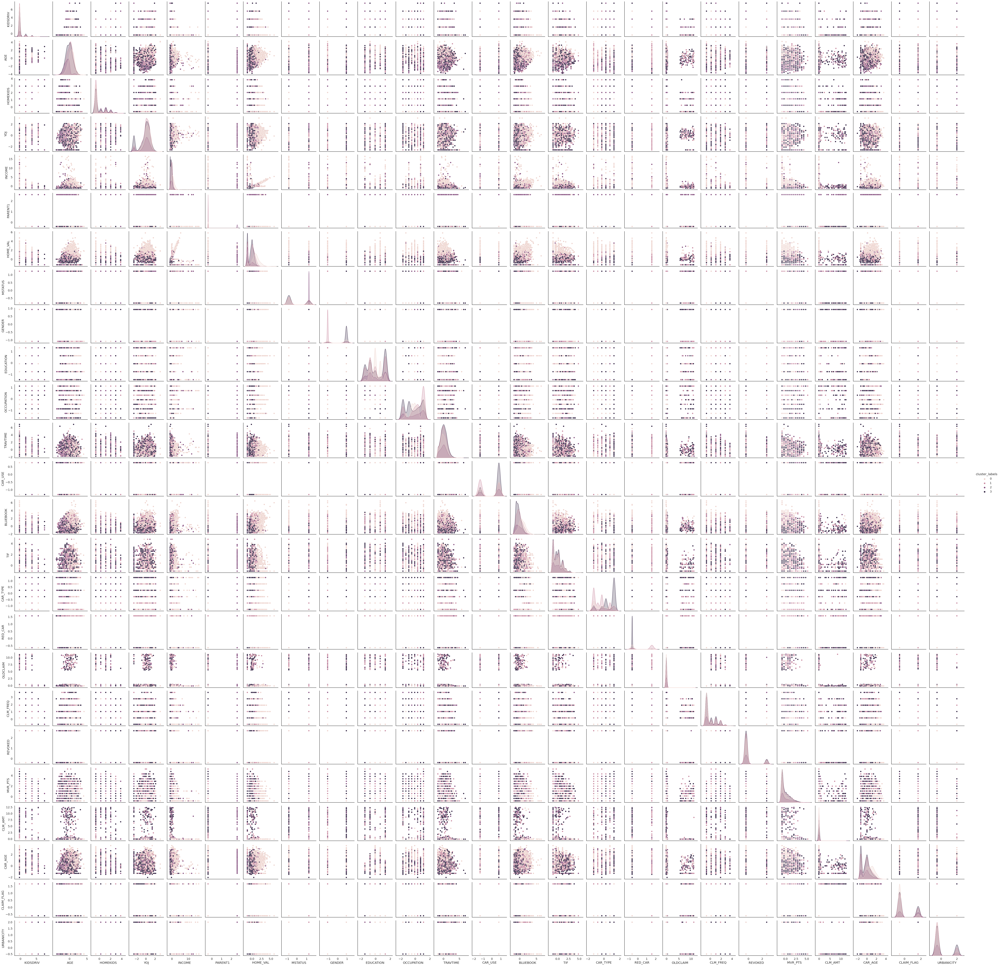

In [ ]:
sns.pairplot(data=carInsuranceDataframe_normalized, hue='cluster_labels')

##### --- Finding the most correlated columns based on correlation coefficient:

In [122]:
correlations = carInsuranceDataframe_normalized.corr()['cluster_labels'].sort_values(ascending=False)
correlations

cluster_labels    1.000000
RED_CAR           0.581464
MSTATUS           0.187418
PARENT1           0.161052
CLAIM_FLAG        0.149241
CLM_FREQ          0.122861
OCCUPATION        0.098648
MVR_PTS           0.097914
HOMEKIDS          0.072343
URBANICITY        0.048465
KIDSDRIV          0.048286
TRAVTIME          0.042200
REVOKED           0.041689
OLDCLAIM          0.037386
CLM_AMT           0.017123
EDUCATION        -0.023583
TIF              -0.034223
YOJ              -0.051527
AGE              -0.149724
CAR_USE          -0.197356
BLUEBOOK         -0.213055
CAR_AGE          -0.236754
CAR_TYPE         -0.247825
INCOME           -0.251057
HOME_VAL         -0.334302
GENDER           -0.556823
Name: cluster_labels, dtype: float64

In [123]:
abs_correlations = abs(correlations)
sorted_abs_correlations = abs_correlations.sort_values(ascending=False)
print(sorted_abs_correlations)

cluster_labels    1.000000
RED_CAR           0.581464
GENDER            0.556823
HOME_VAL          0.334302
INCOME            0.251057
CAR_TYPE          0.247825
CAR_AGE           0.236754
BLUEBOOK          0.213055
CAR_USE           0.197356
MSTATUS           0.187418
PARENT1           0.161052
AGE               0.149724
CLAIM_FLAG        0.149241
CLM_FREQ          0.122861
OCCUPATION        0.098648
MVR_PTS           0.097914
HOMEKIDS          0.072343
YOJ               0.051527
URBANICITY        0.048465
KIDSDRIV          0.048286
TRAVTIME          0.042200
REVOKED           0.041689
OLDCLAIM          0.037386
TIF               0.034223
EDUCATION         0.023583
CLM_AMT           0.017123
Name: cluster_labels, dtype: float64


##### ---Finding the most correlated columns base on chi2:

In [139]:
results = []
for col in carInsuranceDataframe_normalized.columns:
    if col != 'cluster_labels':

        contingency_table = pd.crosstab(carInsuranceDataframe_normalized[col], carInsuranceDataframe_normalized['cluster_labels'])

        chi2, pvalue, _, _ = chi2_contingency(contingency_table)

        results.append({'column': col, 'chi2': chi2, 'pvalue': pvalue})

sorted_results = sorted(results, key=lambda x: x['pvalue'], reverse=False)

for result in sorted_results:
    print(result['column'], ':', 'chi2 =', result['chi2'], ', p-value =', result['pvalue'])

AGE : chi2 = 2109.8103858870645 , p-value = 0.0
HOMEKIDS : chi2 = 3130.8059348154015 , p-value = 0.0
PARENT1 : chi2 = 10170.159794431456 , p-value = 0.0
MSTATUS : chi2 = 2439.0089685988837 , p-value = 0.0
GENDER : chi2 = 5875.649413441442 , p-value = 0.0
EDUCATION : chi2 = 2061.8834648178167 , p-value = 0.0
OCCUPATION : chi2 = 2554.506014908983 , p-value = 0.0
CAR_TYPE : chi2 = 4706.412385848573 , p-value = 0.0
RED_CAR : chi2 = 4728.210465914627 , p-value = 0.0
CAR_AGE : chi2 = 1664.2335454950064 , p-value = 5.050671465501565e-288
CAR_USE : chi2 = 842.9685901026273 , p-value = 2.0751834302409707e-182
CLAIM_FLAG : chi2 = 650.0217541530201 , p-value = 1.440920839086806e-140
KIDSDRIV : chi2 = 640.4739440118128 , p-value = 2.3869255630812232e-129
YOJ : chi2 = 678.3433643952412 , p-value = 5.631217747918185e-104
CLM_FREQ : chi2 = 318.5669468753664 , p-value = 7.656288994447269e-59
URBANICITY : chi2 = 241.24544488531248 , p-value = 5.1188927465380735e-52
MVR_PTS : chi2 = 241.2656516176106 , 

##### ---plotting clusters based on the most correlated columns:

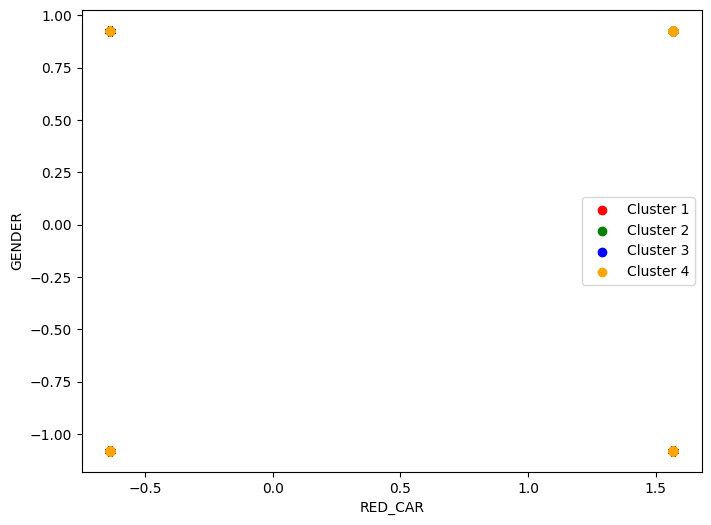

In [131]:
colors = ['red', 'green', 'blue', 'orange']

plt.figure(figsize=(8, 6))
for i in range(4):
    subset = carInsuranceDataframe_normalized[carInsuranceDataframe_normalized['cluster_labels'] == i]
    plt.scatter(subset['RED_CAR'], subset['GENDER'], c=colors[i], label=f'Cluster {i+1}')

plt.legend()
plt.xlabel('RED_CAR')
plt.ylabel('GENDER')
plt.show()

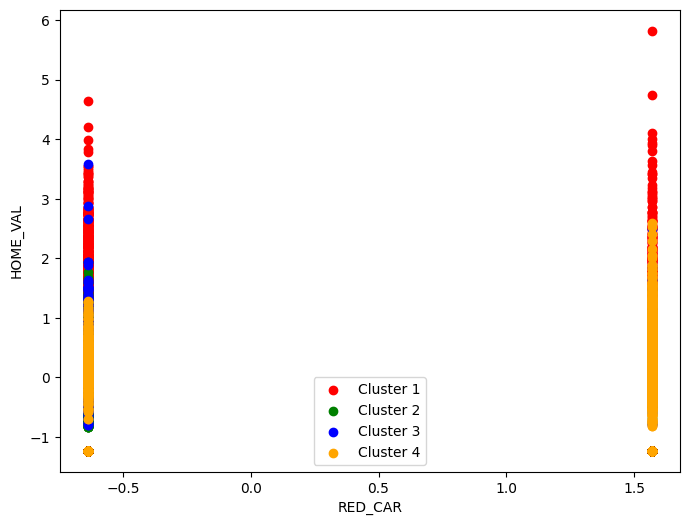

In [161]:
colors = ['red', 'green', 'blue', 'orange']

plt.figure(figsize=(8, 6))
for i in range(4):
    subset = carInsuranceDataframe_normalized[carInsuranceDataframe_normalized['cluster_labels'] == i]
    plt.scatter(subset['RED_CAR'], subset['HOME_VAL'], c=colors[i], label=f'Cluster {i+1}')

plt.legend()
plt.xlabel('RED_CAR')
plt.ylabel('HOME_VAL')
plt.show()

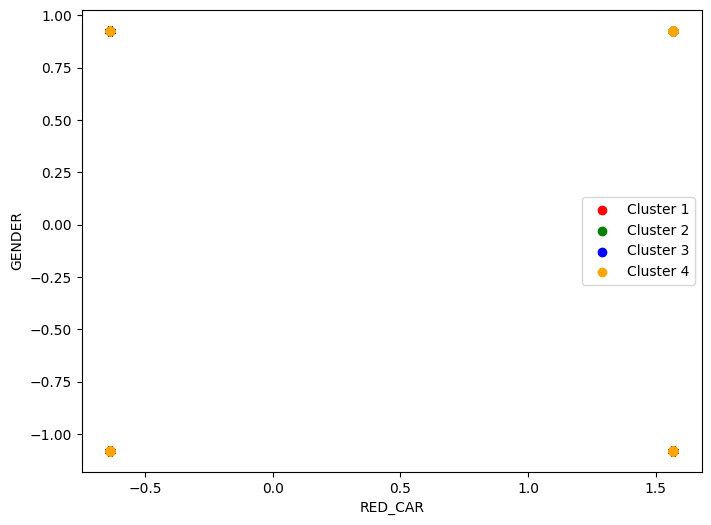

In [162]:
colors = ['red', 'green', 'blue', 'orange']

plt.figure(figsize=(8, 6))
for i in range(4):
    subset = carInsuranceDataframe_normalized[carInsuranceDataframe_normalized['cluster_labels'] == i]
    plt.scatter(subset['RED_CAR'], subset['GENDER'], c=colors[i], label=f'Cluster {i+1}')

plt.legend()
plt.xlabel('RED_CAR')
plt.ylabel('GENDER')
plt.show()

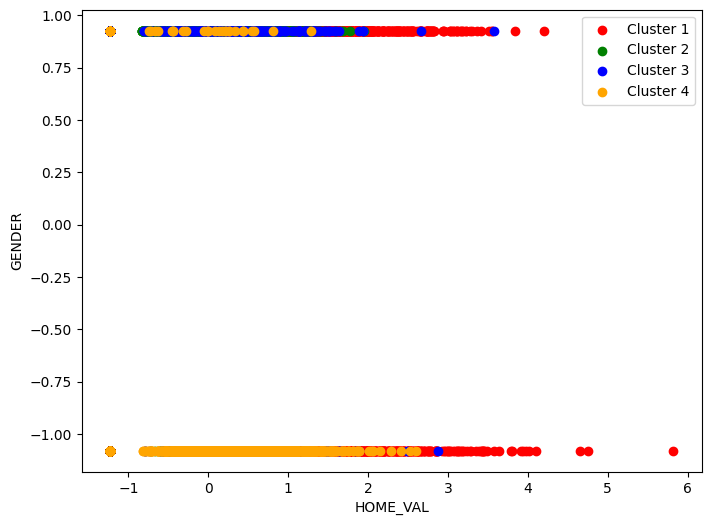

In [132]:
colors = ['red', 'green', 'blue', 'orange']

plt.figure(figsize=(8, 6))
for i in range(4):
    subset = carInsuranceDataframe_normalized[carInsuranceDataframe_normalized['cluster_labels'] == i]
    plt.scatter(subset['HOME_VAL'], subset['GENDER'], c=colors[i], label=f'Cluster {i+1}')

plt.legend()
plt.xlabel('HOME_VAL')
plt.ylabel('GENDER')
plt.show()

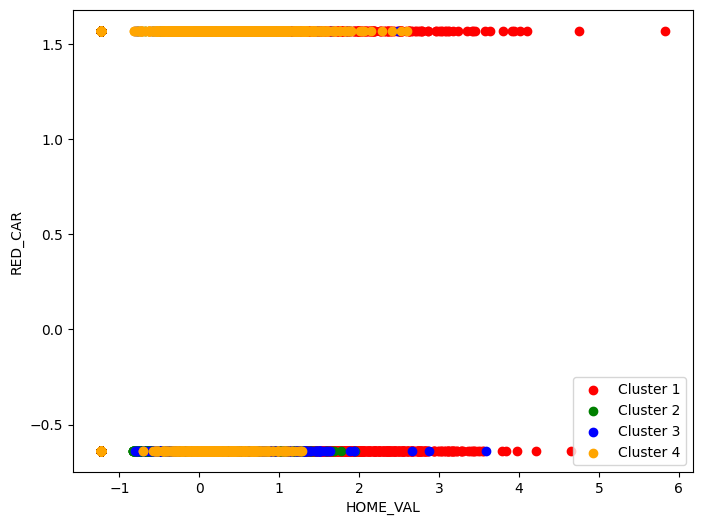

In [133]:
colors = ['red', 'green', 'blue', 'orange']

plt.figure(figsize=(8, 6))
for i in range(4):
    subset = carInsuranceDataframe_normalized[carInsuranceDataframe_normalized['cluster_labels'] == i]
    plt.scatter(subset['HOME_VAL'], subset['RED_CAR'], c=colors[i], label=f'Cluster {i+1}')

plt.legend()
plt.xlabel('HOME_VAL')
plt.ylabel('RED_CAR')
plt.show()

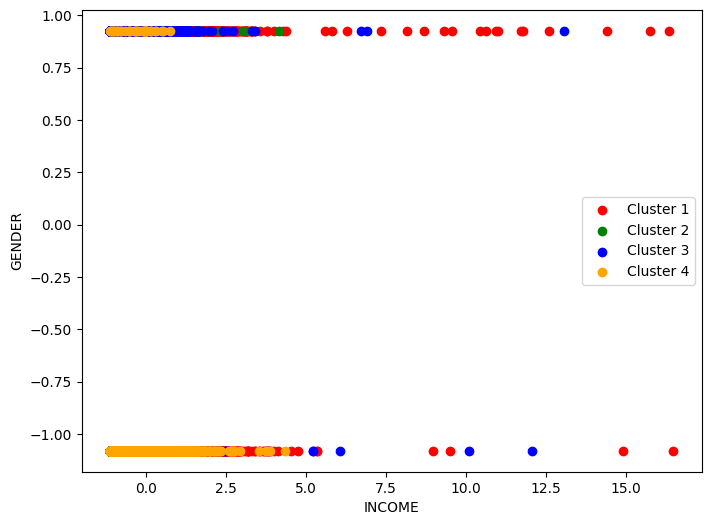

In [134]:
colors = ['red', 'green', 'blue', 'orange']

plt.figure(figsize=(8, 6))
for i in range(4):
    subset = carInsuranceDataframe_normalized[carInsuranceDataframe_normalized['cluster_labels'] == i]
    plt.scatter(subset['INCOME'], subset['GENDER'], c=colors[i], label=f'Cluster {i+1}')

plt.legend()
plt.xlabel('INCOME')
plt.ylabel('GENDER')
plt.show()

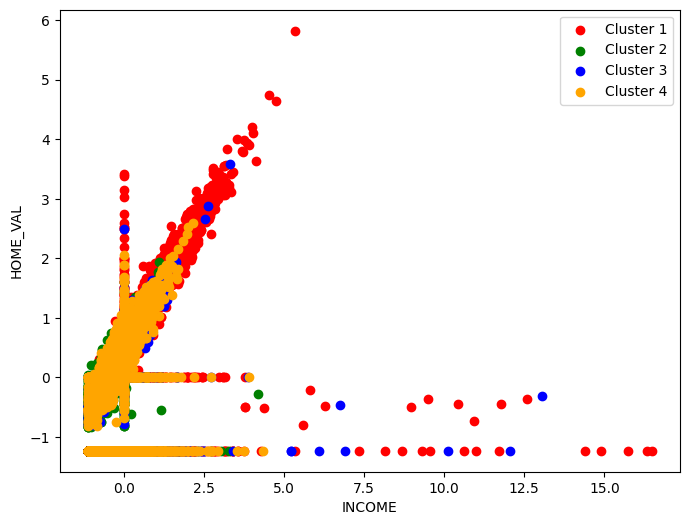

In [160]:
colors = ['red', 'green', 'blue', 'orange']

plt.figure(figsize=(8, 6))
for i in range(4):
    subset = carInsuranceDataframe_normalized[carInsuranceDataframe_normalized['cluster_labels'] == i]
    plt.scatter(subset['INCOME'], subset['HOME_VAL'], c=colors[i], label=f'Cluster {i+1}')

plt.legend()
plt.xlabel('INCOME')
plt.ylabel('HOME_VAL')
plt.show()

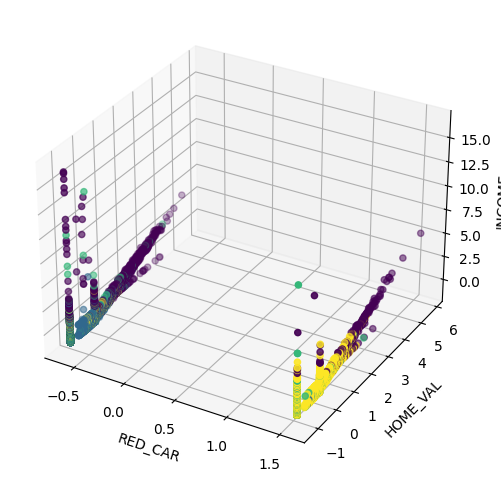

In [163]:
fig = plt.figure(figsize=(6, 6))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(carInsuranceDataframe_normalized['RED_CAR'], carInsuranceDataframe_normalized['HOME_VAL'], carInsuranceDataframe_normalized['INCOME'], c=carInsuranceDataframe_normalized['cluster_labels'])

ax.set_xlabel('RED_CAR')
ax.set_ylabel('HOME_VAL')
ax.set_zlabel('INCOME')

plt.show()


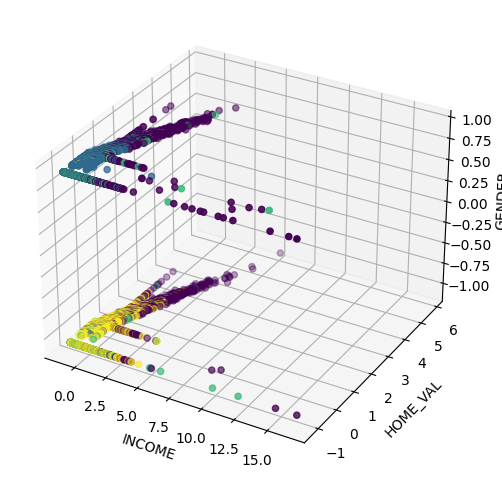

In [153]:
fig = plt.figure(figsize=(6, 6))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(carInsuranceDataframe_normalized['INCOME'], carInsuranceDataframe_normalized['HOME_VAL'], carInsuranceDataframe_normalized['GENDER'], c=carInsuranceDataframe_normalized['cluster_labels'])

ax.set_xlabel('INCOME')
ax.set_ylabel('HOME_VAL')
ax.set_zlabel('GENDER')

plt.show()


# Question 2:

In [6]:
earthquakeDataset = pd.read_csv(earthquakeDatasetPath)

In [7]:
earthquakeDataset.head(5)

,time,latitude,longitude,depth,mag,magType,nst,gap,dmin,rms,...,updated,place,type,horizontalError,depthError,magError,magNst,status,locationSource,magSource
0,2023-04-14T03:45:58.966Z,32.0636,50.0818,10.0,4.5,mb,49.0,62.0,7.640,0.70,...,2023-04-14T04:10:53.040Z,"50 km WSW of F?rs?n, Iran",earthquake,3.40,1.869,0.081,45.0,reviewed,us,us
1,2023-04-07T23:38:12.647Z,28.1032,56.9952,10.0,4.1,mb,55.0,51.0,3.224,0.49,...,2023-04-16T03:29:38.040Z,"108 km N of M?n?b, Iran",earthquake,4.98,1.882,0.088,35.0,reviewed,us,us
2,2023-04-04T14:53:08.017Z,28.2978,56.9272,10.0,4.0,mb,25.0,144.0,3.401,0.94,...,2023-04-04T16:27:10.040Z,"109 km S of K?h Sef?d, Iran",earthquake,13.03,1.950,0.126,17.0,reviewed,us,us
3,2023-04-03T03:55:02.834Z,28.0114,56.9150,10.0,4.3,mb,50.0,108.0,3.119,0.43,...,2023-04-03T04:15:26.040Z,NaN,earthquake,10.57,1.906,0.086,38.0,reviewed,us,us
4,2023-04-02T07:55:27.919Z,27.1929,52.9741,10.0,4.4,mb,40.0,86.0,3.667,0.56,...,2023-04-02T08:20:38.040Z,NaN,earthquake,8.41,1.898,0.095,32.0,reviewed,us,us


In [8]:
earthquakeDataset_selected = earthquakeDataset[['latitude', 'longitude']]

In [10]:
earthquakeDataset_selected.head(5)

,latitude,longitude
0,32.0636,50.0818
1,28.1032,56.9952
2,28.2978,56.9272
3,28.0114,56.9150
4,27.1929,52.9741


In [9]:
total3 = earthquakeDataset_selected.isnull().sum().sort_values(ascending = False)
percent3 = (earthquakeDataset_selected.isnull().sum()/earthquakeDataset_selected.isnull().count()).sort_values(ascending = False)
missing_data3 = pd.concat([total3,percent3], axis = 1, keys = ['Total', 'Percent'])
print(missing_data3.to_string())

           Total  Percent
latitude       0      0.0
longitude      0      0.0


In [11]:
print(earthquakeDataset_selected.dtypes)

latitude     float64
longitude    float64
dtype: object


### Using silhouette score to find the optimal values for epsilon and min-points:


*   Min-points: the fewest number of points required to form a cluster
*   epsilon: the maximum distance two points can be from one another while still belonging to the same cluster


In [183]:
epsilon_values = np.arange(0.001, 1, 0.01)
min_points_values = range(2, 51)
silhouette_scores = []
for epsilon in epsilon_values:
    for min_points in min_points_values:
        model = DBSCAN(eps=epsilon, min_samples=min_points).fit(earthquakeDataset_selected)
        labels = model.labels_
        if len(set(labels)) > 1: # checks if there are at least two unique labels
                                 # assigned by the DBSCAN clustering algorithm.
                                 # If there is only one label, this means that
                                 # all data points belong to the same cluster and
                                 # calculating the silhouette score would not be meaningful.
                                 # Therefore, the silhouette_score calculation is skipped for such cases.
            silhouette = silhouette_score(earthquakeDataset_selected, labels)
            silhouette_scores.append([epsilon, min_points, silhouette])
            print('epsilon=', epsilon, 'min points=', min_points, 'silhouette score=', silhouette)

epsilon= 0.001 min points= 2 silhouette score= -0.4950156952355162
epsilon= 0.011 min points= 2 silhouette score= -0.7226341100233464
epsilon= 0.011 min points= 3 silhouette score= -0.7508176206607108
epsilon= 0.011 min points= 4 silhouette score= -0.5605637182695481
epsilon= 0.011 min points= 5 silhouette score= 0.18902418712228322
epsilon= 0.020999999999999998 min points= 2 silhouette score= -0.5247712003927452
epsilon= 0.020999999999999998 min points= 3 silhouette score= -0.6507015052942942
epsilon= 0.020999999999999998 min points= 4 silhouette score= -0.6791876169699694
epsilon= 0.020999999999999998 min points= 5 silhouette score= -0.6907144771830435
epsilon= 0.020999999999999998 min points= 6 silhouette score= -0.5266016098439301
epsilon= 0.020999999999999998 min points= 7 silhouette score= -0.5341741749249104
epsilon= 0.020999999999999998 min points= 8 silhouette score= 0.1939532353250525
epsilon= 0.030999999999999996 min points= 2 silhouette score= -0.37714805798646006
epsilon= 

In [184]:
silhouette_scores = np.array(silhouette_scores)
max_score_idx = np.argmax(silhouette_scores[:, 2])

print("Optimal values for epsilon and min-points:")
print(f"Epsilon: {silhouette_scores[max_score_idx, 0]}")
print(f"Min-points: {int(silhouette_scores[max_score_idx, 1])}")
print(f"The best silhouette score: {silhouette_scores[max_score_idx, 2]}")

Optimal values for epsilon and min-points:
Epsilon: 0.4809999999999999
Min-points: 38
The best silhouette score: 0.25221085444612634


##### ---> optimal Epsilon: 0.481
##### ---> optimal Min-points: 38
##### ---> silhouette score: 0.252

## Checking the different values of Epsilon: 

In [185]:
epsilon_values = np.arange(0.001, 1, 0.01)
silhouette_scores = []
for epsilon in epsilon_values:
  model = DBSCAN(eps=epsilon, min_samples=38).fit(earthquakeDataset_selected)
  labels = model.labels_
  if len(set(labels)) > 1: # checks if there are at least two unique labels
                           # assigned by the DBSCAN clustering algorithm.
                           # If there is only one label, this means that
                           # all data points belong to the same cluster and
                           # calculating the silhouette score would not be meaningful.
                           # Therefore, the silhouette_score calculation is skipped for such cases.
    silhouette = silhouette_score(earthquakeDataset_selected, labels)
    silhouette_scores.append([epsilon, 38, silhouette])
    print('epsilon=', epsilon, 'min points=', 38, 'silhouette score=', silhouette)

epsilon= 0.08099999999999999 min points= 38 silhouette score= -0.2507429779091693
epsilon= 0.09099999999999998 min points= 38 silhouette score= -0.39575280293059895
epsilon= 0.10099999999999998 min points= 38 silhouette score= -0.4953800352679596
epsilon= 0.11099999999999999 min points= 38 silhouette score= -0.49575771872937374
epsilon= 0.12099999999999998 min points= 38 silhouette score= -0.47680087228056073
epsilon= 0.13099999999999998 min points= 38 silhouette score= -0.45952073962028217
epsilon= 0.141 min points= 38 silhouette score= -0.36400615398955694
epsilon= 0.15099999999999997 min points= 38 silhouette score= -0.31874442069653225
epsilon= 0.16099999999999998 min points= 38 silhouette score= -0.30412742308246277
epsilon= 0.17099999999999999 min points= 38 silhouette score= -0.27053793683007343
epsilon= 0.18099999999999997 min points= 38 silhouette score= -0.2627381333477979
epsilon= 0.19099999999999998 min points= 38 silhouette score= -0.2513764879827719
epsilon= 0.20099999999

In [193]:
silhouette_scores = pd.DataFrame(silhouette_scores)
silhouette_scores

,0,1,2
0,0.081,38,-0.250743
1,0.091,38,-0.395753
2,0.101,38,-0.495380
3,0.111,38,-0.495758
4,0.121,38,-0.476801
...,...,...,...
87,0.951,38,0.195982
88,0.961,38,0.196515
89,0.971,38,0.197670
90,0.981,38,0.197670


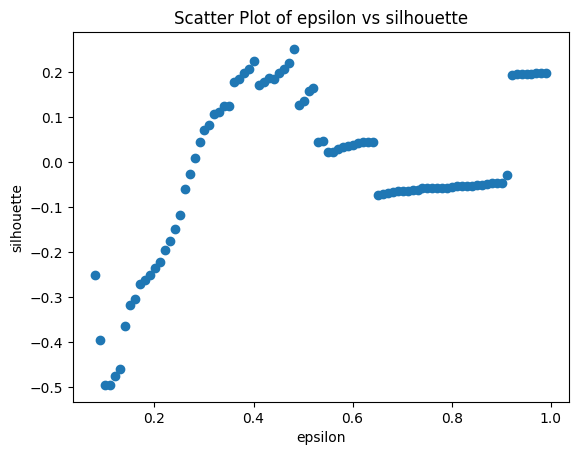

In [198]:
plt.scatter(silhouette_scores[0], silhouette_scores[2])

# Set the title and labels for the plot
plt.title('Scatter Plot of epsilon vs silhouette')
plt.xlabel('epsilon')
plt.ylabel('silhouette')

# Show or save the plot
plt.show()

## Checking the different values of Min-points: 

In [205]:
min_points_values = range(2, 51)
silhouette_scores = []
for min_points in min_points_values:
  model = DBSCAN(eps=0.481, min_samples=min_points).fit(earthquakeDataset_selected)
  labels = model.labels_
  if len(set(labels)) > 1: # checks if there are at least two unique labels
                           # assigned by the DBSCAN clustering algorithm.
                           # If there is only one label, this means that
                           # all data points belong to the same cluster and
                           # calculating the silhouette score would not be meaningful.
                           # Therefore, the silhouette_score calculation is skipped for such cases.
    silhouette = silhouette_score(earthquakeDataset_selected, labels)
    silhouette_scores.append([0.481, min_points, silhouette])
    print('epsilon=', 0.481, 'min points=', min_points, 'silhouette score=', silhouette)

epsilon= 0.481 min points= 2 silhouette score= -0.39496983499677
epsilon= 0.481 min points= 3 silhouette score= -0.35054147991455675
epsilon= 0.481 min points= 4 silhouette score= -0.20922666752606428
epsilon= 0.481 min points= 5 silhouette score= -0.18844422888547638
epsilon= 0.481 min points= 6 silhouette score= -0.19536070959606924
epsilon= 0.481 min points= 7 silhouette score= -0.1063056457734487
epsilon= 0.481 min points= 8 silhouette score= -0.11653768184898024
epsilon= 0.481 min points= 9 silhouette score= -0.10947253249045762
epsilon= 0.481 min points= 10 silhouette score= -0.08812626194347266
epsilon= 0.481 min points= 11 silhouette score= -0.11158132003786789
epsilon= 0.481 min points= 12 silhouette score= -0.11625304380770791
epsilon= 0.481 min points= 13 silhouette score= -0.051260078286930785
epsilon= 0.481 min points= 14 silhouette score= -0.06018371871188963
epsilon= 0.481 min points= 15 silhouette score= -0.067258835452752
epsilon= 0.481 min points= 16 silhouette score=

In [207]:
silhouette_scores = pd.DataFrame(silhouette_scores)
silhouette_scores

,0,1,2
0,0.481,2,-0.394970
1,0.481,3,-0.350541
2,0.481,4,-0.209227
3,0.481,5,-0.188444
4,0.481,6,-0.195361
5,0.481,7,-0.106306
6,0.481,8,-0.116538
7,0.481,9,-0.109473
8,0.481,10,-0.088126
9,0.481,11,-0.111581


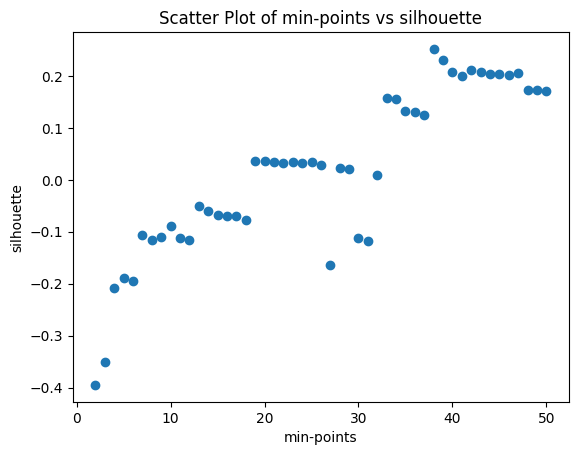

In [208]:
plt.scatter(silhouette_scores[1], silhouette_scores[2])

# Set the title and labels for the plot
plt.title('Scatter Plot of min-points vs silhouette')
plt.xlabel('min-points')
plt.ylabel('silhouette')

# Show or save the plot
plt.show()

### DBSCAN using optimal min-points and optimal epsilon:

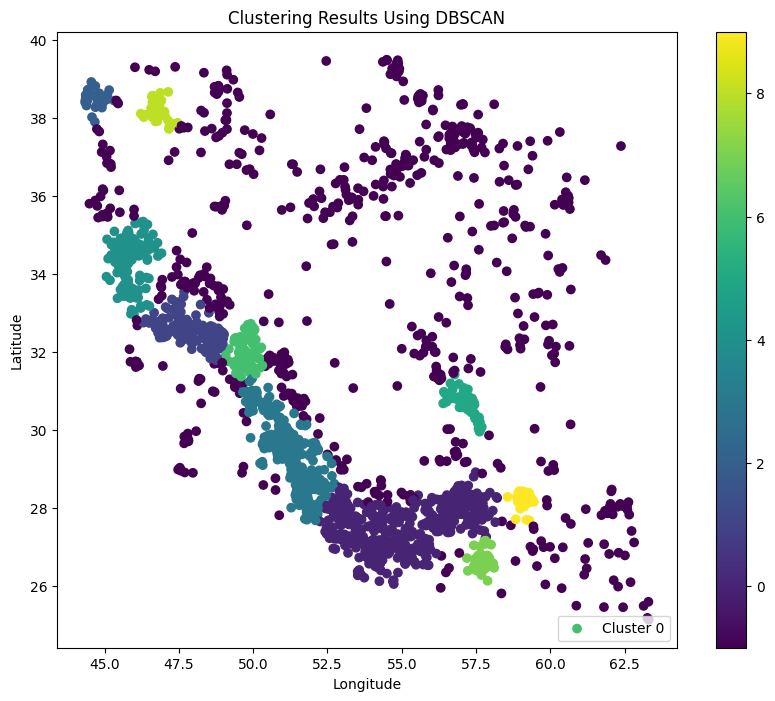

In [213]:
dbscan = DBSCAN(eps=0.481, min_samples=38)

clusters = dbscan.fit_predict(earthquakeDataset_selected)

plt.figure(figsize=(10, 8))
plt.scatter(earthquakeDataset_selected['longitude'], earthquakeDataset_selected['latitude'], c=clusters, cmap='viridis')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('Clustering Results Using DBSCAN')

plt.colorbar()
legend_labels = ['Cluster {}'.format(i) for i in range(len(set(clusters)))]
plt.legend(legend_labels, loc='lower right')

plt.show()

In [214]:
num_clusters = len(set(clusters)) - (1 if -1 in clusters else 0)

print("Number of clusters:", num_clusters)

Number of clusters: 10


## Using more columns in clustering:

In [215]:
earthquakeDataset.columns.values.tolist() 

['time',
 'latitude',
 'longitude',
 'depth',
 'mag',
 'magType',
 'nst',
 'gap',
 'dmin',
 'rms',
 'net',
 'id',
 'updated',
 'place',
 'type',
 'horizontalError',
 'depthError',
 'magError',
 'magNst',
 'status',
 'locationSource',
 'magSource']

In [229]:
earthquakeDataset.dtypes

time                object
latitude           float64
longitude          float64
depth              float64
mag                float64
magType             object
nst                float64
gap                float64
dmin               float64
rms                float64
net                 object
id                  object
updated             object
place               object
type                object
horizontalError    float64
depthError         float64
magError           float64
magNst             float64
status              object
locationSource      object
magSource           object
dtype: object

In [230]:
magType_categories = earthquakeDataset['magType'].unique().tolist()

print(magType_categories)

['mb', 'mww', 'mwb', 'mwr', 'ml', 'mwc', 'mb_lg', 'mblg']


In [231]:
type_categories = earthquakeDataset['type'].unique().tolist()

print(type_categories)

['earthquake']


In [232]:
status_categories = earthquakeDataset['status'].unique().tolist()

print(status_categories)

['reviewed']


In [233]:
locationSource_categories = earthquakeDataset['locationSource'].unique().tolist()

print(locationSource_categories)

['us', 'teh', 'isk', 'thr', 'us_teh', 'us_thr']


In [234]:
magSource_categories = earthquakeDataset['magSource'].unique().tolist()

print(magSource_categories)

['us', 'teh', 'gcmt', 'us_teh', 'thr']


##### -- checking missing values in target columns:

In [12]:
earthquakeDataset_target = earthquakeDataset.loc[:, ['latitude',
                                                     'longitude', 
                                                     'depth',
                                                     'mag',
                                                     'nst',
                                                     'gap',
                                                     'dmin',
                                                     'rms',
                                                     'horizontalError',
                                                     'depthError',
                                                     'magError',
                                                     'magNst']].copy()

earthquakeDataset_target

,latitude,longitude,depth,mag,nst,gap,dmin,rms,horizontalError,depthError,magError,magNst
0,32.0636,50.0818,10.0,4.5,49.0,62.0,7.640,0.70,3.40,1.869,0.081,45.0
1,28.1032,56.9952,10.0,4.1,55.0,51.0,3.224,0.49,4.98,1.882,0.088,35.0
2,28.2978,56.9272,10.0,4.0,25.0,144.0,3.401,0.94,13.03,1.950,0.126,17.0
3,28.0114,56.9150,10.0,4.3,50.0,108.0,3.119,0.43,10.57,1.906,0.086,38.0
4,27.1929,52.9741,10.0,4.4,40.0,86.0,3.667,0.56,8.41,1.898,0.095,32.0
...,...,...,...,...,...,...,...,...,...,...,...,...
2790,26.7370,53.5670,10.0,4.8,86.0,98.3,NaN,0.91,NaN,NaN,NaN,15.0
2791,27.0620,55.6140,10.0,4.7,87.0,106.2,NaN,1.19,NaN,NaN,NaN,28.0
2792,26.9850,55.5700,10.0,4.7,66.0,106.3,NaN,0.82,NaN,NaN,NaN,12.0
2793,35.7000,48.9700,4.0,4.1,29.0,95.0,NaN,NaN,NaN,NaN,NaN,NaN


In [13]:
total4 = earthquakeDataset_target.isnull().sum().sort_values(ascending = False)
percent4 = (earthquakeDataset_target.isnull().sum()/earthquakeDataset_target.isnull().count()).sort_values(ascending = False)
missing_data4 = pd.concat([total4, percent4], axis = 1, keys = ['Total', 'Percent'])
print(missing_data4.to_string())

                 Total   Percent
nst               1850  0.661896
dmin              1061  0.379606
horizontalError    987  0.353131
magError           715  0.255814
depthError         639  0.228623
rms                485  0.173524
gap                359  0.128444
magNst             218  0.077996
latitude             0  0.000000
longitude            0  0.000000
depth                0  0.000000
mag                  0  0.000000


In [14]:
earthquakeDataset_target['nst'] = earthquakeDataset_target['nst'].fillna(np.mean(earthquakeDataset_target['nst']), inplace=False).astype(int)

In [15]:
earthquakeDataset_target['dmin'] = earthquakeDataset_target['dmin'].fillna(np.mean(earthquakeDataset_target['dmin']), inplace=False)

In [16]:
earthquakeDataset_target['horizontalError'] = earthquakeDataset_target['horizontalError'].fillna(np.mean(earthquakeDataset_target['horizontalError']), inplace=False)

In [17]:
earthquakeDataset_target['magError'] = earthquakeDataset_target['magError'].fillna(np.mean(earthquakeDataset_target['magError']), inplace=False)

In [18]:
earthquakeDataset_target['depthError'] = earthquakeDataset_target['depthError'].fillna(np.mean(earthquakeDataset_target['depthError']), inplace=False)

In [19]:
earthquakeDataset_target['rms'] = earthquakeDataset_target['rms'].fillna(np.mean(earthquakeDataset_target['rms']), inplace=False)

In [20]:
earthquakeDataset_target['gap'] = earthquakeDataset_target['gap'].fillna(np.mean(earthquakeDataset_target['gap']), inplace=False).astype(int)

In [21]:
earthquakeDataset_target['magNst'] = earthquakeDataset_target['magNst'].fillna(np.mean(earthquakeDataset_target['magNst']), inplace=False).astype(int)

In [22]:
total4 = earthquakeDataset_target.isnull().sum().sort_values(ascending = False)
percent4 = (earthquakeDataset_target.isnull().sum()/earthquakeDataset_target.isnull().count()).sort_values(ascending = False)
missing_data4 = pd.concat([total4, percent4], axis = 1, keys = ['Total', 'Percent'])
print(missing_data4.to_string())

                 Total  Percent
latitude             0      0.0
longitude            0      0.0
depth                0      0.0
mag                  0      0.0
nst                  0      0.0
gap                  0      0.0
dmin                 0      0.0
rms                  0      0.0
horizontalError      0      0.0
depthError           0      0.0
magError             0      0.0
magNst               0      0.0


In [23]:
earthquakeDataset_target.dtypes

latitude           float64
longitude          float64
depth              float64
mag                float64
nst                  int64
gap                  int64
dmin               float64
rms                float64
horizontalError    float64
depthError         float64
magError           float64
magNst               int64
dtype: object

In [27]:
#### excluding 'time', 'magType', 'net', 'type', 'status', 'id', 'updated', 'locationSource', 'magSource' and 'place'

all_features = ['depth',
 'mag',
 'nst',
 'gap',
 'dmin',
 'rms',
 'horizontalError',
 'depthError',
 'magError',
 'magNst']

selected_features = ['latitude', 'longitude']

result_list = []

for i in range(1, len(all_features) - 1):
    for combo in combinations(all_features, i):
        feature_set = list(selected_features) + list(combo)
        earthquakeDataset_subset = earthquakeDataset_target[feature_set]
        
        model = DBSCAN(eps=0.481, min_samples=38).fit(earthquakeDataset_subset)
        labels = model.labels_

        if len(set(labels)) > 1: # checks if there are at least two unique labels
                                 # assigned by the DBSCAN clustering algorithm.
                                 # If there is only one label, this means that
                                 # all data points belong to the same cluster and
                                 # calculating the silhouette score would not be meaningful.
                                 # Therefore, the silhouette_score calculation is skipped for such cases.
            sil_score = silhouette_score(earthquakeDataset_subset, labels)
            result_list.append((feature_set, sil_score))

sorted_result = sorted(result_list, key=lambda x: x[1], reverse=True)

for feature_set, sil_score in sorted_result:
    print(f"feature set={feature_set} ----> silhouette_score={sil_score}")

feature set=['latitude', 'longitude', 'magError'] ----> silhouette_score=0.24791918673902189
feature set=['latitude', 'longitude', 'rms'] ----> silhouette_score=0.2028531274125941
feature set=['latitude', 'longitude', 'rms', 'magError'] ----> silhouette_score=0.1994432823082572
feature set=['latitude', 'longitude', 'mag'] ----> silhouette_score=0.06941784967905548
feature set=['latitude', 'longitude', 'mag', 'magError'] ----> silhouette_score=0.06632441487479201
feature set=['latitude', 'longitude', 'dmin'] ----> silhouette_score=0.029534796685493917
feature set=['latitude', 'longitude', 'dmin', 'magError'] ----> silhouette_score=0.02307591883094499
feature set=['latitude', 'longitude', 'nst'] ----> silhouette_score=-0.014628476819817117
feature set=['latitude', 'longitude', 'nst', 'magError'] ----> silhouette_score=-0.020914342422489407
feature set=['latitude', 'longitude', 'dmin', 'rms'] ----> silhouette_score=-0.027984279841454244
feature set=['latitude', 'longitude', 'dmin', 'rms',

In [29]:
sorted_result = np.array(sorted_result)
max_score_idx = np.argmax(sorted_result[:, 1])

print("The most accurate clustering model:")
print(f"Feature set: {sorted_result[max_score_idx, 0]}")
print(f"silhouette score: {sorted_result[max_score_idx, 1]}")

The most accurate clustering model:
Feature set: ['latitude', 'longitude', 'magError']
silhouette score: 0.24791918673902189


##### ---> optimal Epsilon: 0.481
##### ---> optimal Min-points: 38
##### ---> feature set: ['latitude', 'longitude', 'magError']
##### ---> silhouette score: 0.247

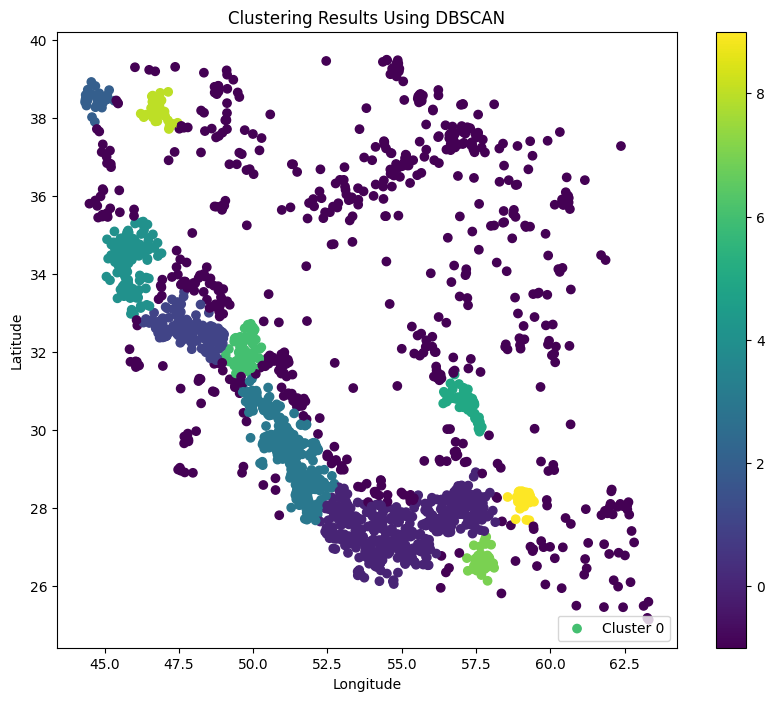

In [31]:
model = DBSCAN(eps=0.481, min_samples=38).fit(earthquakeDataset_target[['latitude', 'longitude', 'magError']])
clusters = model.labels_

plt.figure(figsize=(10, 8))
plt.scatter(earthquakeDataset_target['longitude'], earthquakeDataset_target['latitude'], c=clusters, cmap='viridis')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('Clustering Results Using DBSCAN')

plt.colorbar()
legend_labels = ['Cluster {}'.format(i) for i in range(len(set(clusters)))]
plt.legend(legend_labels, loc='lower right')

plt.show()

In [32]:
num_clusters = len(set(clusters)) - (1 if -1 in clusters else 0)

print("Number of clusters:", num_clusters)

Number of clusters: 10
